# Preprocess audio samples

While the `CNN` class in OpenSoundscape contains a default Preprocessor, you may want to modify or create your own Preprocessor depending on the specific way you wish to generate samples. 

Note that the default preprocessor that is a good starting point for training, and if you're using a pre-trained CNN for prediction you don't need to (and probably shouldn't!) modify the preprocessing. So, if you just want to train or predict with CNNs, you might not need to delve into the depths of this tutorial. However, for those trying to create high-performing custom models, using custom preprocessing is a powerful way to improve their performance.

This tutorial describes how you can use two important types of objects in OpenSoundscape to modify preprocessing.

* `Preprocessors` in OpenSoundscape perform all of the preprocessing steps from loading a file from disk, up to providing a sample to the machine learning algorithm for training or prediction. They are designed to be flexible and customizable. These classes are used internally by classes such as `opensoundscape.ml.cnn.CNN` when (a) training a machine learning model in OpenSoundscape, or (b) making predictions with a machine learning model in OpenSoundscape. 
* `Datasets` are PyTorch's way of handling a list of inputs to preprocess. In OpenSoundscape, there are two built-in classes (`AudioFileDataset` and `AudioSplittingDataset`) which use a Preprocessor to generate samples from a list of file paths. 


## Run this tutorial

This tutorial is more than a reference! It's a Jupyter Notebook which you can run and modify on Google Colab or your own computer.

|Link to tutorial|How to run tutorial|
| :- | :- |
| [![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/kitzeslab/opensoundscape/blob/master/docs/tutorials/preprocess_audio_dataset.ipynb) | The link opens the tutorial in Google Colab. Uncomment the "installation" line in the first cell to install OpenSoundscape. |
| [![Download via DownGit](https://img.shields.io/badge/GitHub-Download-teal?logo=github)](https://minhaskamal.github.io/DownGit/#/home?url=https://github.com/kitzeslab/opensoundscape/blob/master/docs/tutorials/preprocess_audio_dataset.ipynb) | The link downloads the tutorial file to your computer. Follow the [Jupyter installation instructions](https://opensoundscape.org/en/latest/installation/jupyter.html), then open the tutorial file in Jupyter. |


## Intro to custom preprocessing

Preprocessors are designed to be flexible and modular, so that each step of the preprocessing pipeline can be modified or removed. This notebook demonstrates:

- preparation of audio data to be used by a preprocessor
- how "Actions" are strung together in a Preprocessor to define how samples are generated
- modifying the parameters of actions
- turning Actions on and off
- modifying the order and contents of a Preprocessor
- use of the `SpectrogramPreprocessor` class, including examples of:
    * modifying audio and spectrogram parameters
    * changing the output image shape
    * changing the output type
    * turning augmentation on and off
    * modifying augmentation parameters
    * using the "overlay" augmentation
- writing custom preprocessors and actions

it also uses the Dataset classes to demonstrate
- how to load one sample per file path
- how to load long audio files as a series of shorter clips


### How to access preprocessors
When training a CNN model in OpenSoundscape, you will create an object of the CNN class. There are two ways to modify the preprocessing:

1) Modify the model.preprocessor directly.

    The model contains a preprocessor object that you can modify, for instance:
    ```python
    model.preprocessor.pipeline.bandpass.bypass = True
    ```

2) Overwrite the preprocessor with a new one:

    ```python
    my_preprocessor = SpectrogramPreprocessor(....) #this tutorial explains how to make a preprocessor
    #... modify it as desired...
    model.preprocessor = my_preprocessor
    ```

### Notes on augmentations
While training, the CNN class will use all actions in the preprocessor's pipeline. When runing validation or prediction, by default, the CNN will bypass any actions with `action.is_augmentation==True`.

Note that if you want to create a preprocessor with overlay augmentation, it's easiest to use option 2 above and initialize the preprocessor with an `overlay_df`. 

## Information for Pytorch Users
If you're looking to use OpenSoundscape's preprocessing tools, but use PyTorch (or Jax) directly for the rest of your training workflows, this section is for you. 

The `opensoundscape.ml.datasets.AudioFileDataset` and `opensoundscape.ml.datasets.AudioSplittingDataset` classes are subclases of torch's `Dataset` and can often be used as drop-in substitutions, just use a `DataLoader` collate function that returns the typical PyTorch DataLoader format: a tuple of (samples, labels) where each is a tensor with a leading batch dimension. A collate function with this behavior is provided in `opensoundscape.ml.utils`. Here's a quick exmaple:

```python
from opensoundscape import AudioFileDataset, SpectrogramPreprocessor
from opensoundscape.ml.utils import collate_audio_samples_to_tensors

preprocessor = SpectrogramPreprocessor(sample_duration=2,height=224,width=224)
audio_dataset = AudioFileDataset(label_df,preprocessor)

train_dataloader = DataLoader(
    audio_dataset,
    batch_size=64,
    shuffle=True,
    collate_fn = collate_audio_samples_to_tensors
)
```



## Set up tutorial

In [1]:
# if this is a Google Colab notebook, install opensoundscape in the runtime environment
if 'google.colab' in str(get_ipython()):
  %pip install opensoundscape

First, import some packages.

In [2]:
# Preprocessor classes are used to load, transform, and augment audio samples for use in a machine learing model
from opensoundscape.preprocess.preprocessors import SpectrogramPreprocessor
from opensoundscape.ml.datasets import AudioFileDataset, AudioSplittingDataset


# helper function for displaying a sample as an image 
from opensoundscape.preprocess.utils import show_tensor, show_tensor_grid

#other utilities and packages
import torch
import pandas as pd
from pathlib import Path
import numpy as np
import random
import subprocess
import IPython.display as ipd

/Users/SML161/opensoundscape/opensoundscape/ml/cnn.py:19: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


Set up plotting 

In [3]:
#set up plotting
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize']=[15,5] #for large visuals
%config InlineBackend.figure_format = 'retina'

Set manual seeds for pytorch and python. These ensure the training results are reproducible. You probably don't want to do this when you actually train your model, but it's useful for debugging.

In [4]:
torch.manual_seed(0)
np.random.seed(0)
random.seed(0)

### Get example audio data


The Kitzes Lab has created a small labeled dataset of short clips of American Woodcock vocalizations. You have two options for obtaining the folder of data, called `woodcock_labeled_data`:

1. Run the following cell to download this small dataset. These commands require you to have `tar` installed on your computer, as they will download and unzip a compressed file in `.tar.gz` format. 

2. Download a `.zip` version of the files by clicking [here](https://pitt.box.com/shared/static/m0cmzebkr5qc49q9egxnrwwp50wi8zu5.zip). You will have to unzip this folder and place the unzipped folder in the same folder that this notebook is in.

**Note**: Once you have the data, you do not need to run this cell again.

In [5]:
subprocess.run(['curl','https://drive.google.com/uc?export=download&id=1Ly2M--dKzpx331cfUFdVuiP96QKGJz_P','-L', '-o','woodcock_labeled_data.tar.gz']) # Download the data
subprocess.run(["tar","-xzf", "woodcock_labeled_data.tar.gz"]) # Unzip the downloaded tar.gz file
subprocess.run(["rm", "woodcock_labeled_data.tar.gz"]) # Remove the file after its contents are unzipped

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 9499k  100 9499k    0     0   538k      0  0:00:17  0:00:17 --:--:--  830k


CompletedProcess(args=['rm', 'woodcock_labeled_data.tar.gz'], returncode=0)

### Load dataframe of files and labels
We need a dataframe with file paths in the index, so we manipulate the included one_hot_labels.csv slightly:

In [6]:
# load one-hot labels dataframe
labels = pd.read_csv('./woodcock_labeled_data/one_hot_labels.csv').set_index('file')

# prepend the folder location to the file paths
labels.index = pd.Series(labels.index).apply(lambda f: './woodcock_labeled_data/'+f)

#inspect
labels.head()

,present,absent
file,,
./woodcock_labeled_data/d4c40b6066b489518f8da83af1ee4984.wav,1,0
./woodcock_labeled_data/e84a4b60a4f2d049d73162ee99a7ead8.wav,0,1
./woodcock_labeled_data/79678c979ebb880d5ed6d56f26ba69ff.wav,1,0
./woodcock_labeled_data/49890077267b569e142440fa39b3041c.wav,1,0
./woodcock_labeled_data/0c453a87185d8c7ce05c5c5ac5d525dc.wav,1,0


## Preprocessors

(As another reminder, you might not need to make your own preprocessor if you are using the CNN class. The CNN class creates its own preprocessor object by default and stores it in the `.preprocessor` attribute - you can modify that or overwrite it with your own)

Preprocessors prepare samples for use by machine learning algorithms by performing a sequential procedure on each sample, like a recipe. The procedure is defined by a **Pipeline** which contains a sequential set of steps called **Actions**. There are 3 important characteristics of Preprocessors and Actions:

1. A Preprocessor has a `pipeline` which defines a list of `Actions` to perform on each sample

2. `Actions` contain parameters that modify their behavior in the attribute `.params`. You can modify parameter values directly or use the action's .set() method to change parameter values. 

3. Preprocessing can be performed with or without augmentation. The Preprocessor's `.bypass_augmentations` boolean variable will determine whether Actions in the pipeline with attribute `.is_augmentation==True` are performed or bypassed


The default preprocessor class for CNNs, `SpectrogramPreprocessor`, loads audio in two distinct modes: 
* (a) loading one sample per file
* (b) splitting files into clips, and creating a sample from each clip. You can see examples of each mode below. By default, OpenSoundscape's CNN class loads one sample per row in the training dataframe during `.train()`, but internally splits long audio files into clips when using `.predict()`. 

In this notebook, you will see how to edit, add, remove, and bypass Actions in the `pipeline` to modify the Preprocessing procedure. 

The CNN class in OpenSoundscape has an internal Preprocessor object which it use to generate samples during training, validation, and prediction. We can modify or overwrite the cnn model's preprocessor object if we want to change how it generates samples. 

The starting point for most preprocessors will be the `SpectrogramPreprocessor` class, which loads audio files, creates spectrograms from the audio, performs various augmentations, and returns a pytorch Tensor. 

### Create a preprocessor

We need to tell the preprocessor the duration (in seconds) of each sample it should create.

In [7]:
pre = SpectrogramPreprocessor(sample_duration=2.0)

## Datasets

A dataset pairs a set of samples (possibly including labels) with a preprocessor.

The dataset draws samples from its `.df` attribute which must be dataframe formatted in a a very specific way: 

- the index of the dataframe provides paths to audio samples
- the columns are the class names
- the values are 0 (absent/False) or 1 (present/True) for each sample and each class.

**Note:** you never have to manually create Datasets to train and predict with OpenSoundscape's CNN class. They are created internally.

### Initialize a dataset for short, labeled clips

For example, we've set up the labels dataframe with files as the index and classes as the columns, so we can use it to make an instance of `AudioFileDataset`. This dataset assumes that each file in the dataset is a single short clip; it does not split longer clips into segments. For a dataset for that purpose (`AudioSplitterDataset`), see more information in later sections.

In [8]:
dataset = AudioFileDataset(labels,pre)

### Generate a sample from a Dataset

We can ask a dataset for a specific sample using its numeric index, like accessing an element of a list. Each sample is a dictionary with two keys: 'X', the Tensor of the sample, and 'y', the Tensor of labels of the sample. The shape of 'X' is [channels, height, width] and the shape of 'y' is [number of classes].

In [9]:
dataset[0] #loads and preprocesses the sample at row 0 of dataset.df

AudioSample(source=woodcock_labeled_data/d4c40b6066b489518f8da83af1ee4984.wav, start_time=0.0,end_time=2.0, labels=present    1
absent     0
Name: ./woodcock_labeled_data/d4c40b6066b489518f8da83af1ee4984.wav, dtype: int64)

### Visualize multiple samples
Using a helper function, we can easily visualze a set of samples on a grid. We _highly_ recommend inspecting your preprocessed samples in this way before training or predicting with a machine learning model. By inspecting the samples, you can confirm that your labeled data is reasonable and that the preprocessing is representing your samples in a reasonable way. 

/Users/SML161/miniconda3/envs/opso_dev/lib/python3.9/site-packages/matplotlib_inline/config.py:68: DeprecationWarning: InlineBackend._figure_format_changed is deprecated in traitlets 4.1: use @observe and @unobserve instead.
  def _figure_format_changed(self, name, old, new):


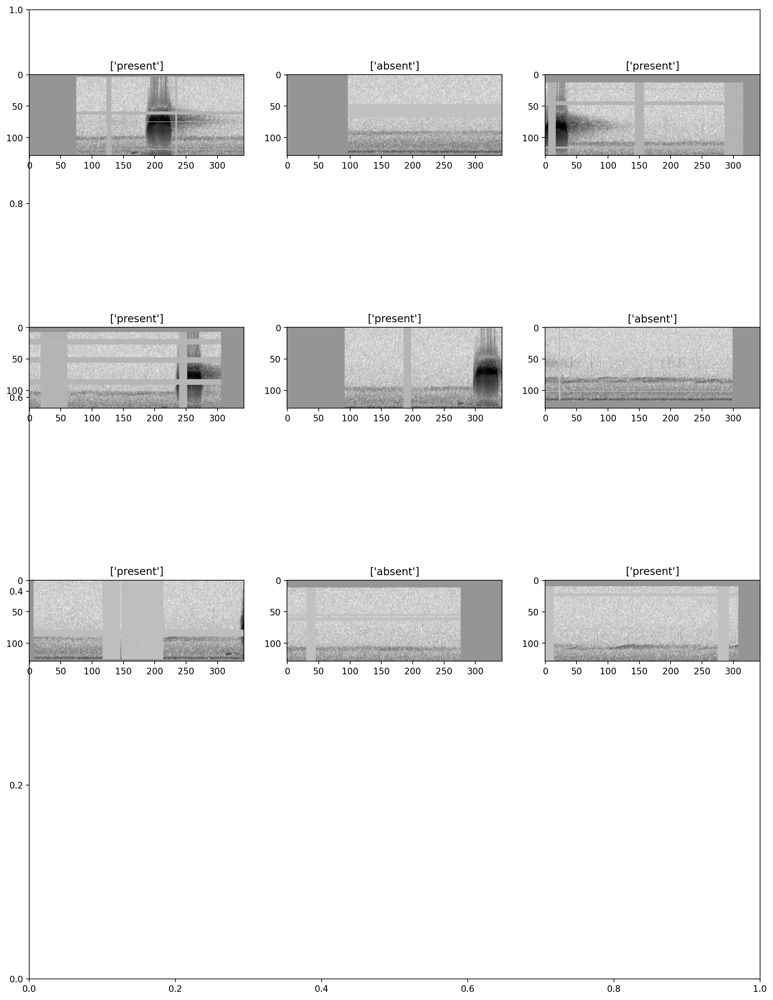

In [10]:
from opensoundscape.preprocess.utils import show_tensor_grid

pre = SpectrogramPreprocessor(sample_duration=2.0)
dataset = AudioFileDataset(labels,pre)

tensors = [dataset[i].data for i in range(9)]
sample_labels = [list(dataset[i].labels[dataset[i].labels>0].index) for i in range(9)]

_ = show_tensor_grid(tensors,3,labels=sample_labels)


Let's repeat the exercise of inspecting preprocessed samples, this time without augmentation.

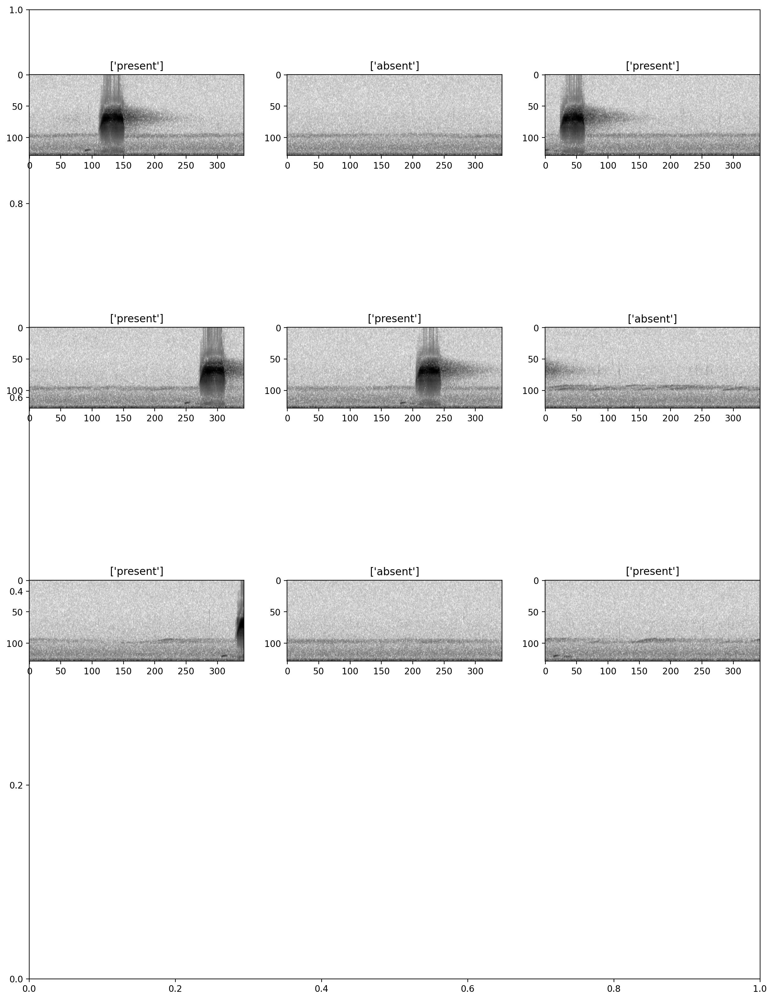

In [11]:
dataset.bypass_augmentations = True

tensors = [dataset[i].data for i in range(9)]
sample_labels = [list(dataset[i].labels[dataset[i].labels>0].index) for i in range(9)]

_ = show_tensor_grid(tensors,3,labels=sample_labels)

### DataLoaders and batch sizes 

During machine learning tasks with Pytorch, a `DataLoader` is often used on top of a Dataset to "batch" samples - that is, to prepare multiple samples at once. A batch returned by a DataLoader will have an extra leading dimension for both 'X' and 'y'; for instance, a `batch_size` of 16 would produce 'X' withs shape [16, 3, 224, 224] for 3-channel 224x224 tensors and 'y' with shape [16, 5] if the labels contain 5 classes (columns). OpenSoundscape uses DataLoaders internally to create batches of samples during CNN training and prediction. 

### Subset samples from a Dataset

Preprocessors allow you to select a subset of samples using `sample()` and `head()` methods (like pandas `DataFrames`). 

Note that these methods subset files from the *index*. They do not subset individual clips from files.

In [12]:
print("Length of original dataset", len(dataset))

Length of original dataset 29


Select the first 10 samples (non-random):

In [13]:
first_10_dataset = dataset.head(10)
print("Dataset length after selecting first 10 samples:", len(first_10_dataset))

Dataset length after selecting first 10 samples: 10


Randomly select an absolute number of samples:

In [14]:
random_10_dataset = dataset.sample(n=10)
print("Dataset length after selecting random 10 samples:", len(random_10_dataset))

Dataset length after selecting random 10 samples: 10


Randomly select a fraction of samples

In [15]:
fraction_dataset = dataset.sample(frac=0.5)
print("Dataset length after selecting random 50% of samples:", len(fraction_dataset))

Dataset length after selecting random 50% of samples: 14


## Preprocess long audio files

When preprocessing should result in many fixed-length samples for long input files, instead of one sample per file, we use `AudioSplittingDataset` instead of `AudioFileDataset`. This dataset can be customized with parameters for: 

- fractional overlap between consecutive samples
- how to handle remaining audio at the end of a file (if it is shorter than the desired sample duration)

The `CNN.predict()` function uses `AudioSplittingDataset` internally, so that the user can specify long audio file paths and get back predictions on fixed-length clips. (If one sample per file is desired, you can pass the argument `split_files_into_clips=False` to `CNN.predict()`.)

Here's an example of how to use `AudioSplittingDataset` to create several samples from a long audio file.

**Note:** you never have to manually create Datasets (`AudioSplittingDataset` or `AudioFileDataset`) to train and predict with the CNN class. They are created internally.

In [16]:
prediction_df = pd.DataFrame(index=['./woodcock_labeled_data/field_data/60s_field_data_sample_1.wav'])

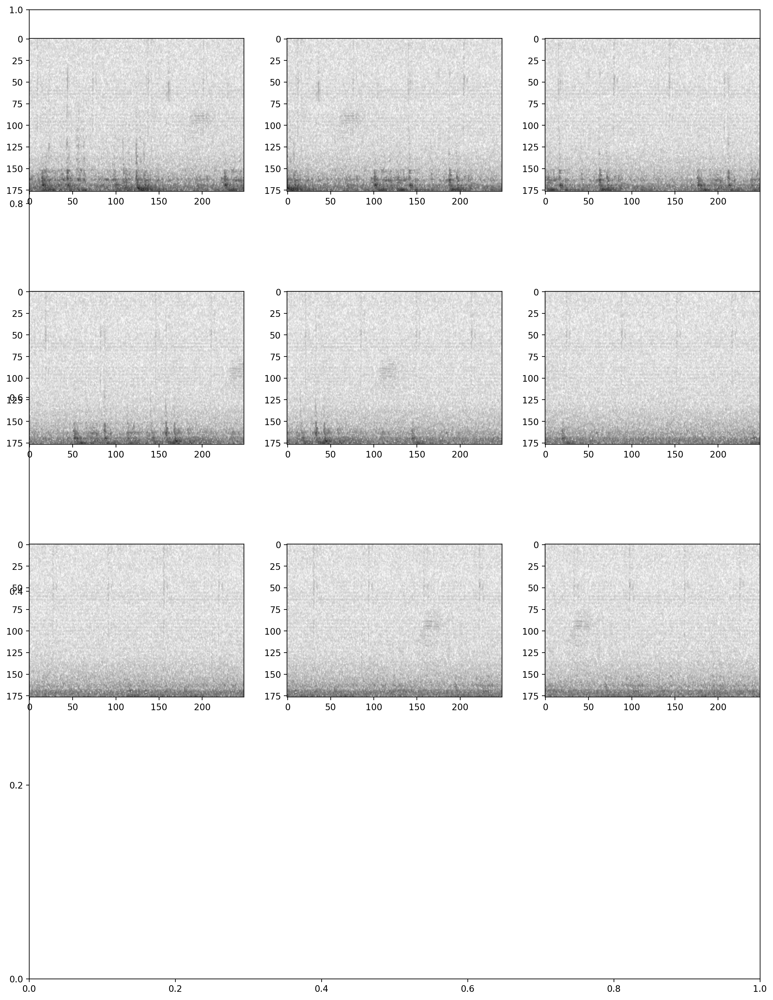

In [17]:
pre = SpectrogramPreprocessor(sample_duration=2.0)
splitting_dataset = AudioSplittingDataset(prediction_df,pre,overlap_fraction=0.5)
splitting_dataset.bypass_augmentations = True

#get the first 9 samples and plot them
tensors = [splitting_dataset[i].data for i in range(9)]

_ = show_tensor_grid(tensors,3)

## Preprocessor pipelines and actions

Each Preprocessor class has a `pipeline` which is an ordered set of operations that are performed on each sample, in the form of a pandas.Series object. Each element of the series is an object of class Action (or one of its subclasses) and represents a transformation on the sample. 

### About Pipelines

The preprocessor's Pipeline is the ordered list of Actions that the preprocessor performs on each sample. 

* The Pipeline is stored in the `preprocessor.pipeline` attribute.

* You can modify the contents or order of Preprocessor Actions by overwriting the preprocessor's `.pipeline` attribute. When you modify this attribute, you must provide pd.Series with elements name:Action, where each Action is an instance of a class that sub-classes `opensoundscape.preprocess.BaseAction`.

Let's Inspect the current pipeline of our preprocessor.

In [18]:
# inspect the current pipeline (ordered sequence of Actions to take)
preprocessor = SpectrogramPreprocessor(sample_duration=2)
preprocessor.pipeline

load_audio           Action calling <bound method Audio.from_file o...
random_trim_audio    Augmentation Action calling <function trim_aud...
trim_audio           Action calling <function trim_audio at 0x2aac5...
to_spec              Action calling <bound method Spectrogram.from_...
bandpass             Action calling <function Spectrogram.bandpass ...
to_tensor            Action calling <function Spectrogram.to_image ...
time_mask            Augmentation Action calling <function time_mas...
frequency_mask       Augmentation Action calling <function frequenc...
add_noise            Augmentation Action calling <function tensor_a...
rescale              Action calling <function scale_tensor at 0x2aa...
random_affine        Augmentation Action calling <function torch_ra...
dtype: object

### About actions

Each element of the preprocessor's `pipeline` (a pd.Series) contains a name (string) and an action (Action)

* Each Action takes a sample (and its labels), performs some transformation to them, and returns the sample (and its labels).

* You can generate an Action based on a function like this : Action(fn=my_function, other parameters...). The function you pass (`my_function` in this case) must expect the sample as the first argument. It can then take additional parameters. For instance, if we define the function:

    ```
    def multiply(x,n):
        return x*n
    ```
    
    then we can create an action to multiply by 3 with `action=Action(fn=multiply,n=3)`

* Any customizable parameters for performing the Action are stored in a dictionary, `.params`. These parameters can be modified directly (e.g. `Action.params.param1=value1`) or using the Action's `.set()` method (e.g. `action.set(param=value, param2=value2, ...)` )

* You can bypass an action in a pipeline by changing `Action.bypass` to `True`

* You can declare whether an Action is an augmentation (should not be performed if bypass_augmentation=True) using its `.is_augmentation` boolean attribute



## Modify Actions

### View default parameters for an Action
the `.params` attribute of an Action is a pandas Series containing parameters that can be modified

In [19]:
#since the pipeline is a series, we can access elements like pipeline.to_spec as well as pipeline['to_spec']
preprocessor.pipeline.to_spec.params

window_type              hann
window_samples           None
window_length_sec        None
overlap_samples          None
overlap_fraction         None
fft_size                 None
dB_scale                 True
scaling              spectrum
dtype: object

### Modify Action parameters

we can modify parameters with the Action's .set() method:

In [20]:
preprocessor.pipeline.to_spec.set(dB_scale=False)

or by accessing the parameter directly (params is a pandas Series)

In [21]:
preprocessor.pipeline.to_spec.params.window_samples = 512
preprocessor.pipeline.to_spec.params['overlap_fraction'] = 0.75

preprocessor.pipeline.to_spec.params

window_type              hann
window_samples            512
window_length_sec        None
overlap_samples          None
overlap_fraction         0.75
fft_size                 None
dB_scale                False
scaling              spectrum
dtype: object

### Bypass actions
Actions can be bypassed by changing the attribute `.bypass=True`. A bypassed action is never performed regardless of the `.perform_augmentations` attribute. 

In [22]:
preprocessor = SpectrogramPreprocessor(sample_duration=2.0)

#turn off augmentations other than noise
preprocessor.pipeline.add_noise.bypass=True
preprocessor.pipeline.time_mask.bypass=True
preprocessor.pipeline.frequency_mask.bypass=True

#printing the pipeline will show which actions are bypassed
preprocessor.pipeline

load_audio           Action calling <bound method Audio.from_file o...
random_trim_audio    Augmentation Action calling <function trim_aud...
trim_audio           Action calling <function trim_audio at 0x2aac5...
to_spec              Action calling <bound method Spectrogram.from_...
bandpass             Action calling <function Spectrogram.bandpass ...
to_tensor            Action calling <function Spectrogram.to_image ...
time_mask            ## Bypassed ## Augmentation Action calling <fu...
frequency_mask       ## Bypassed ## Augmentation Action calling <fu...
add_noise            ## Bypassed ## Augmentation Action calling <fu...
rescale              Action calling <function scale_tensor at 0x2aa...
random_affine        Augmentation Action calling <function torch_ra...
dtype: object

create a Dataset with this preprocessor and our label dataframe

random affine off


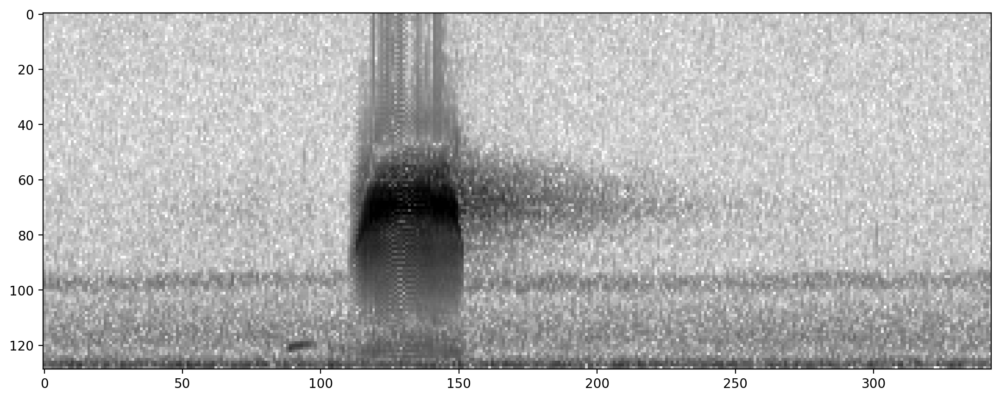

random affine on


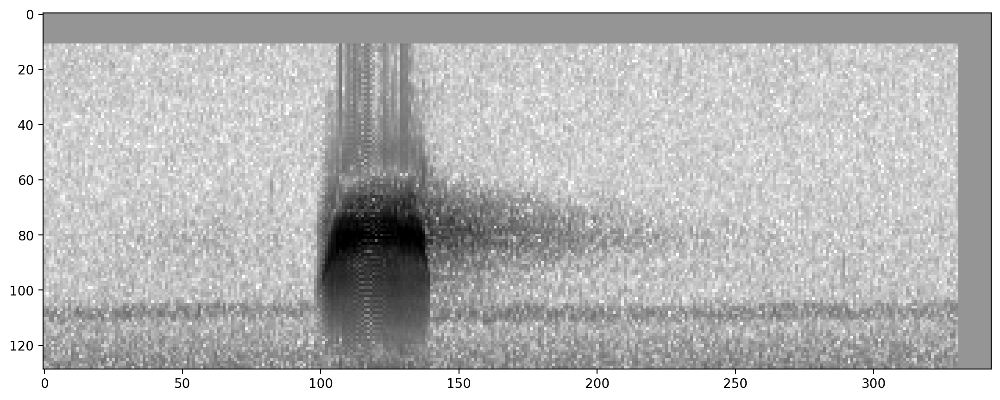

In [23]:
dataset = AudioFileDataset(labels,preprocessor)

print('random affine off')
preprocessor.pipeline.random_affine.bypass = True
show_tensor(dataset[0].data,transform_from_zero_centered=True)
plt.show()

print('random affine on')
preprocessor.pipeline.random_affine.bypass = False
show_tensor(dataset[0].data,transform_from_zero_centered=True)

To view whether an individual Action in a pipeline is on or off, inspect its `bypass` attribute:

In [24]:
# The AudioLoader Action that is still on
preprocessor.pipeline.load_audio.bypass

False

In [25]:
# The frequency_mask Action that we turned off
preprocessor.pipeline.frequency_mask.bypass

True

## Modify the pipeline
Sometimes, you may want to change the order or composition of the Preprocessor's pipeline. You can simply overwrite the `.pipeline` attribute, as long as it is a pandas Series of names:Actions

### Example: return Spectrogram instead of Tensor
Here's an example where we replace the pipeline with one that just loads audio and converts it to a Spectrogram, returning a Spectrogram instead of a Tensor:

original pipeline:
Action calling <bound method Audio.from_file of <class 'opensoundscape.audio.Audio'>>
Augmentation Action calling <function trim_audio at 0x2aac5c160>
Action calling <function trim_audio at 0x2aac5c160>
Action calling <bound method Spectrogram.from_audio of <class 'opensoundscape.spectrogram.Spectrogram'>>
Action calling <function Spectrogram.bandpass at 0x292830f70>
Action calling <function Spectrogram.to_image at 0x292831280>
Augmentation Action calling <function time_mask at 0x2aac68430>
Augmentation Action calling <function frequency_mask at 0x2aac684c0>
Augmentation Action calling <function tensor_add_noise at 0x2aac68550>
Action calling <function scale_tensor at 0x2aac683a0>
Augmentation Action calling <function torch_random_affine at 0x2aac68280>

new pipeline:
Action calling <bound method Audio.from_file of <class 'opensoundscape.audio.Audio'>>
Augmentation Action calling <function trim_audio at 0x2aac5c160>
Action calling <function trim_audio at 0x2aac5c160>

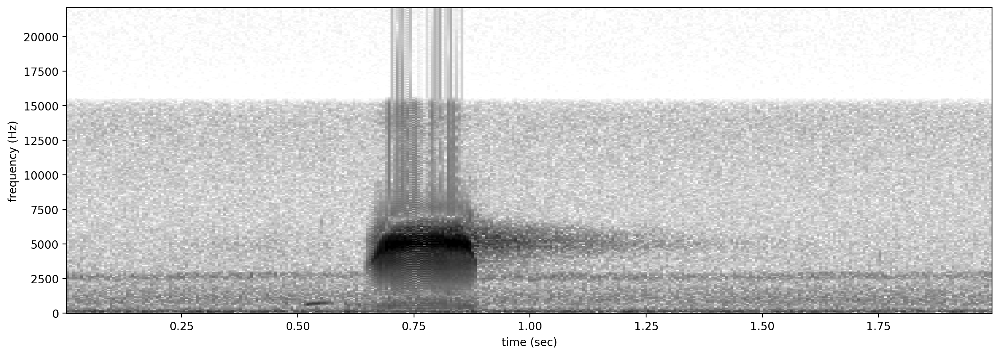

In [26]:
#initialize a preprocessor 
preprocessor = SpectrogramPreprocessor(2.0)
print('original pipeline:')
[print(p) for p in pre.pipeline]

#overwrite the pipeline with a slice of the original pipeline
print('\nnew pipeline:')
preprocessor.pipeline = preprocessor.pipeline[0:4]
[print(p) for p in preprocessor.pipeline]

print('\nWe now have a preprocessor that returns Spectrograms instead of Tensors:')
dataset = AudioFileDataset(labels,preprocessor)
print(f"Type of returned sample: {type(dataset[0].data)}")
dataset[0].data.plot()

## Analyze/debug the pipeline
In order to debug the Preprocessor's pipeline you can utilize the `trace` argument to save and review the output of `action` step in the pipeline as part of the sample information returned by the preprocessor.

In [27]:
# initialize a preprocessor 
preprocessor = SpectrogramPreprocessor(2.0)
pre.pipeline

load_audio           Action calling <bound method Audio.from_file o...
random_trim_audio    Augmentation Action calling <function trim_aud...
trim_audio           Action calling <function trim_audio at 0x2aac5...
to_spec              Action calling <bound method Spectrogram.from_...
bandpass             Action calling <function Spectrogram.bandpass ...
to_tensor            Action calling <function Spectrogram.to_image ...
time_mask            Augmentation Action calling <function time_mas...
frequency_mask       Augmentation Action calling <function frequenc...
add_noise            Augmentation Action calling <function tensor_a...
rescale              Action calling <function scale_tensor at 0x2aa...
random_affine        Augmentation Action calling <function torch_ra...
dtype: object

In [28]:
# pass a sample through the preprocessor's pipeline
file = labels.iloc[0].name
start_time = 0
sample = preprocessor.forward((file,start_time), trace=True)
sample.trace

/Users/SML161/opensoundscape/opensoundscape/preprocess/preprocessors.py:168: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '<Audio(samples=(88200,), sample_rate=44100)>' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  sample.trace[k] = copy.deepcopy(sample.data)


load_audio                <Audio(samples=(88200,), sample_rate=44100)>
random_trim_audio         <Audio(samples=(88200,), sample_rate=44100)>
trim_audio                <Audio(samples=(88200,), sample_rate=44100)>
to_spec              <Spectrogram(spectrogram=(257, 343), frequenci...
bandpass             <Spectrogram(spectrogram=(129, 343), frequenci...
to_tensor            [[[tensor(0.3036), tensor(0.3001), tensor(0.34...
time_mask            [[[tensor(0.3036), tensor(0.3001), tensor(0.34...
frequency_mask       [[[tensor(0.3036), tensor(0.3001), tensor(0.34...
add_noise            [[[tensor(0.3036), tensor(0.2960), tensor(0.35...
rescale              [[[tensor(-0.3929), tensor(-0.4081), tensor(-0...
random_affine        [[[tensor(0.), tensor(0.), tensor(0.), tensor(...
dtype: object

### Analyse the output at steps of interest

In [29]:
# Initial audio
sample.trace['load_audio']

<Audio(samples=(88200,), sample_rate=44100)>

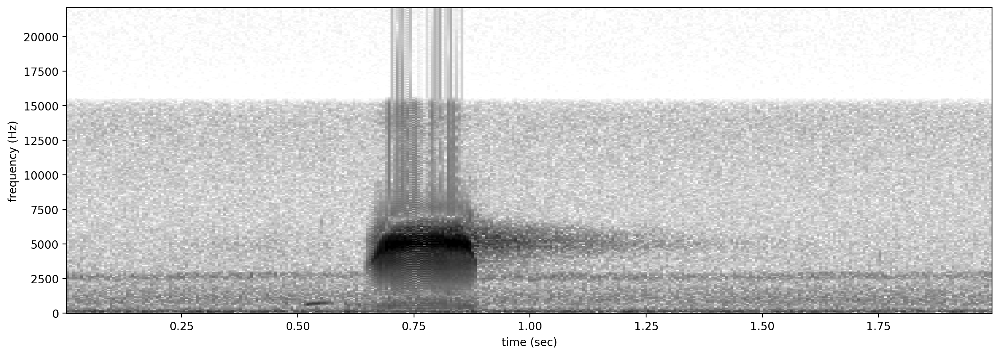

In [30]:
# Initial spectrogram
sample.trace["to_spec"].plot()

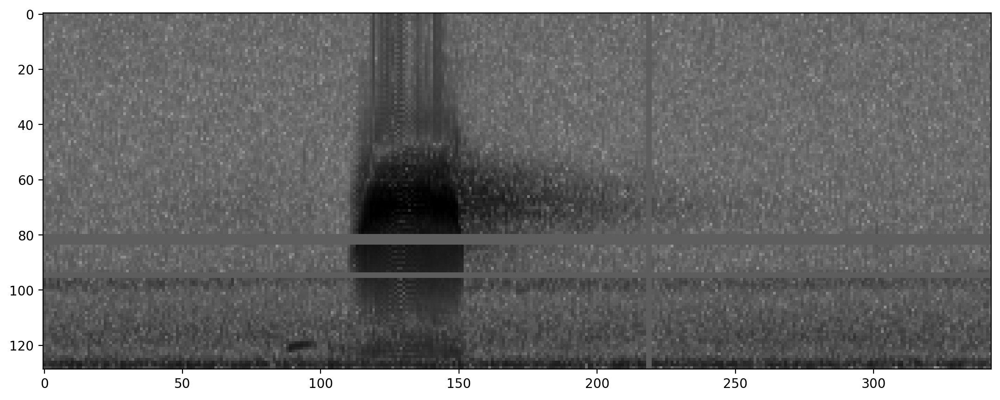

In [31]:
# After applyin frequency mask
show_tensor(sample.trace["frequency_mask"])

## Add Preprocessor to CNN

You can always overwrite the preprocessor of a CNN model object with a new one:
```
my_preprocessor = SpectrogramPreprocessor(....) 
...
model.preprocessor = my_preprocessor
```
_WARNING_: Be careful! If your new preprocessor has a different sample duration (eg 3 seconds instead of 2) or shape (eg [100,100,3] instead of [224,224,1]), these new values will also take effect when using the CNN. 

## Customize preprocessing for better training

The right choice of preprocessing depends heavily on the characteristics of the sounds you wish to study. The best way to tune preprocessing parameters is to visually inspect samples created by your preprocessing procedure and tweak parameters to achieve visual clarity of the sounds of interest in your samples. We find these heuristics to be a good starting point:

- The duration of a sample should be approximately 2-5x the duration of the target sound. For instance, a very short nocturnal flight call lasting 0.1 seconds might be best visualized with a 0.3 second sample_duration. Meahwhile, a 10-second bout of ruffed grouse drumming might deserve a 20 second sample_duartion. 

- The frequency range of a sample should be wider than the target sound, but not by more than 1 order of magnitude. For instance, sounds that are low-pitched will be more clearly visualized when bandpassing a spectrogram to the low frequencies. If you use a 0-10,000 Hz spectrogram for a 500 Hz target sound, your target sound will only occupy a small fraction of your sample. 

- Spectrogram parameters should be matched to the temporal or spectral features of the target sound. Modify the Spectorgram's window_samples to achieve high enough time resolution (lower value of window_samples) or frequency resolution (higher value of window_samples) to see features of your target sound clearly on the resulting sample. For example, a rapid trill with a pulse repetition rate of 50 Hz will only be distinctive on a spectrogram if the Spectrogram windows are less than `1/(50*2) = 0.01` seconds in duration. On the other hand, visualizing a distinctive harmonic "ladder" structure of a nasal sound might require long spectrogram windows which will increase frequency resolution.

Augmentations are Actions that are only performed during training, not during prediction. These actions manipulate the sample in some randomized way, so that each time the same sample is provided to the model as training data, the actual values of the sample are different. This prevents over-training of a model on a training set and effectively increases the size of a training dataset. In general, you can expect that a basic set of augmentations (such as those included by default in the SpecPreprocessor and CNN classes) will be necessary to train a useful machine learning model. In particular, "overlay" augmentations which blend together multiple samples often increase the generalizability (transferability) of a model. You might choose to use audio from your target system (for instance, field recordings at your study site) to make the training data look more similar to the data that the model will be applied to. 

Below are various examples of how to modify parameters of the Actions to achieve different preprocessing outcomes. 

### Modify the sample rate 
Resample all loaded audio to a specified rate during the load_audio action

In [32]:
pre = SpectrogramPreprocessor(sample_duration=2)

pre.pipeline.load_audio.set(sample_rate=24000)

### Modify spectrogram window length and overlap
(see Spectrogram.from_audio() for detailed documentation)

default parameters:


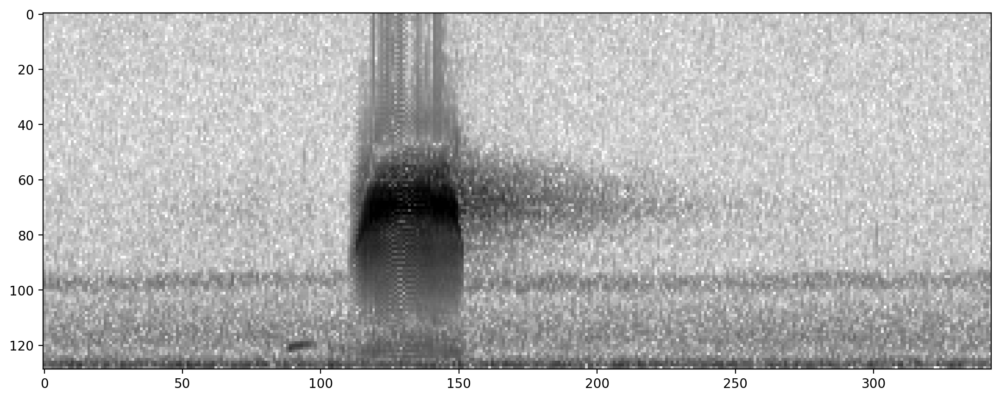

high time resolution, low frequency resolution:


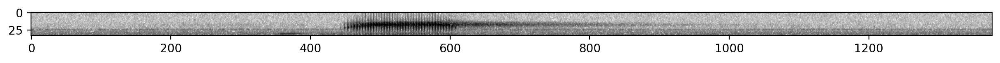

In [33]:
dataset = AudioFileDataset(labels,SpectrogramPreprocessor(sample_duration=2))
dataset.bypass_augmentations=True

print('default parameters:')
show_tensor(dataset[0].data)
plt.show()

print('high time resolution, low frequency resolution:')
dataset.preprocessor.pipeline.to_spec.set(window_samples=128)

show_tensor(dataset[0].data)

### Bandpass spectrograms
Trim spectrograms to a specified frequency range:

default parameters:
bandpassed to 2-4 kHz:


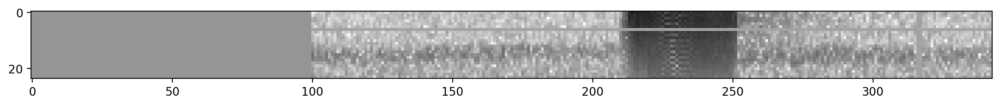

In [34]:
dataset = AudioFileDataset(labels, SpectrogramPreprocessor(2.0))

print('default parameters:')
show_tensor(dataset[0].data,invert=True,transform_from_zero_centered=True)

print('bandpassed to 2-4 kHz:')
dataset.preprocessor.pipeline.bandpass.set(min_f=2000,max_f=4000)
show_tensor(dataset[0].data)

### Change the output shape

Change the shape of the output sample 

First, inspect the .height, .width, and .channels attributes of the preprocessor, which determine the shape of the output. Values of "None" mean that the output is not reshaped, the preprocessors simply retains the shape of tensors created in the pipeline. 

In [37]:
dataset.preprocessor.height, dataset.preprocessor.width, dataset.preprocessor.channels

(None, None, 1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.013633609..0.9849545].


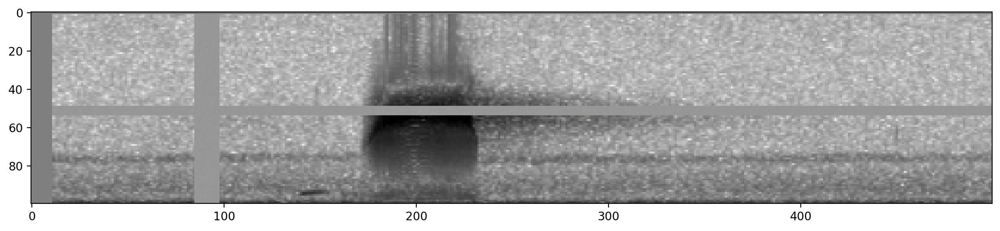

In [39]:
dataset = AudioFileDataset(labels, SpectrogramPreprocessor(2.0))

dataset.preprocessor.height = 100
dataset.preprocessor.width = 500
dataset.preprocessor.channels = 3
show_tensor(dataset[0].data,invert=True)

### Turn all augmentation on or off
augmentation is controlled by the `preprocessor.bypass_augmentation` boolean (aka True/False) variable. By default, augmentations are performed. A CNN will internally manipulate this attribute to perform augmentations during training but not during validation or prediction.

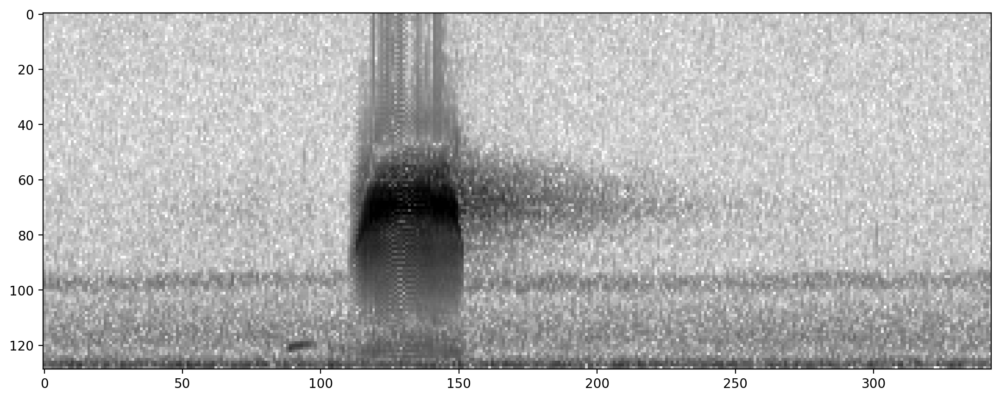

In [40]:
dataset = AudioFileDataset(labels, SpectrogramPreprocessor(2.0))

dataset.bypass_augmentations = True
show_tensor(dataset[0].data)

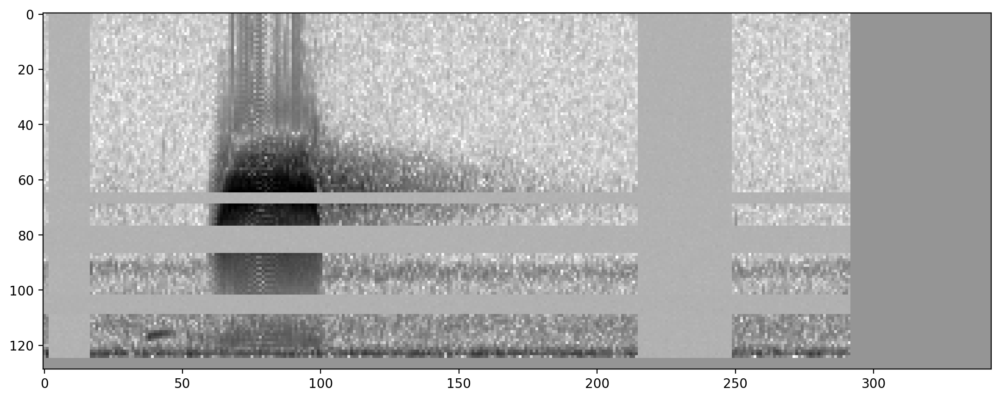

In [41]:
dataset.bypass_augmentations = False
show_tensor(dataset[0].data)

### Modify augmentation parameters
`SpectrogramPreprocessor` includes several augmentations with customizable parameters. Here we provide a couple of illustrative examples - see any action's documentation for details on how to use its parameters. 

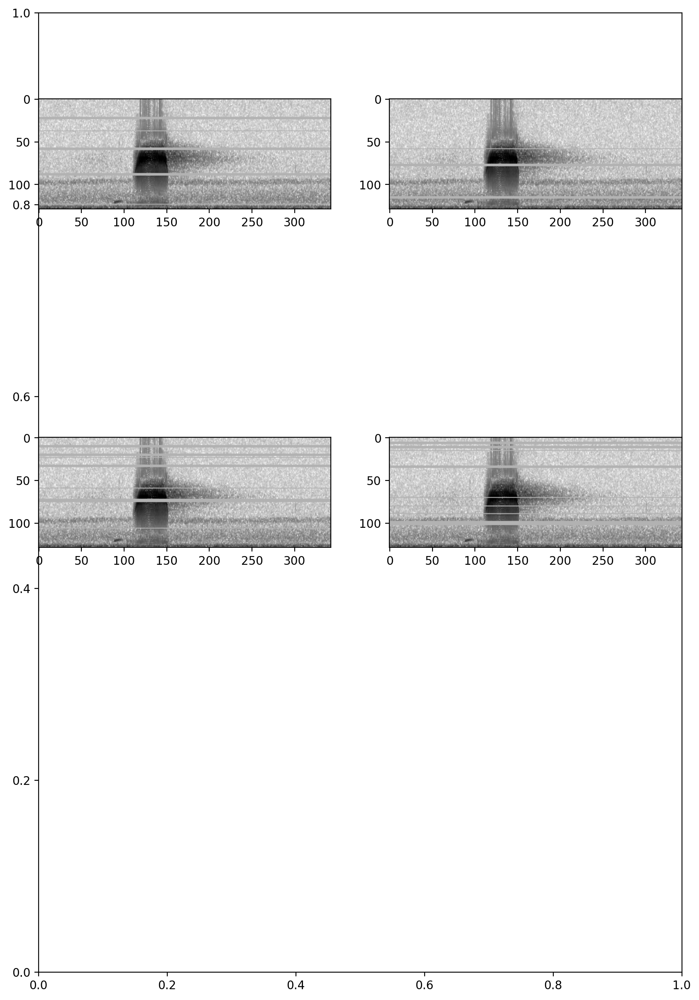

In [42]:
#initialize a preprocessor
preprocessor = SpectrogramPreprocessor(2.0)

#turn off augmentations other than overlay
preprocessor.pipeline.random_affine.bypass=True
preprocessor.pipeline.time_mask.bypass=True
preprocessor.pipeline.add_noise.bypass=True

# allow up to 20 horizontal masks, each spanning up to 0.1x the height of the image. 
preprocessor.pipeline.frequency_mask.set(max_width = 0.03, max_masks=20)

#preprocess the same sample 4 times
dataset = AudioFileDataset(labels,preprocessor)
tensors = [dataset[0].data for i in range(4)]
fig = show_tensor_grid(tensors,2)
plt.show()

turn off frequency mask and turn on gaussian noise

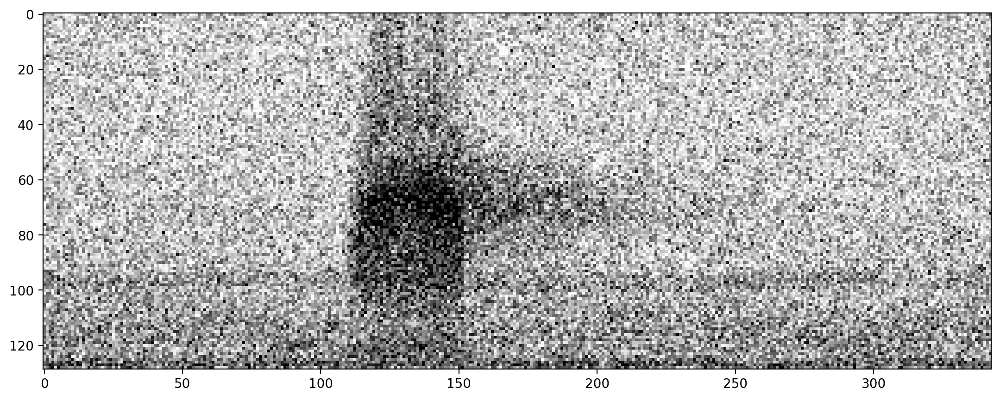

In [43]:
dataset.preprocessor.pipeline.add_noise.bypass = False
dataset.preprocessor.pipeline.frequency_mask.bypass =True

# increase the intensity of gaussian noise added to the image
dataset.preprocessor.pipeline.add_noise.set(std=0.2)
show_tensor(dataset[0].data)

### Remove an action by its name

In [44]:
preprocessor.remove_action('add_noise')
preprocessor.pipeline

load_audio           Action calling <bound method Audio.from_file o...
random_trim_audio    Augmentation Action calling <function trim_aud...
trim_audio           Action calling <function trim_audio at 0x2aac5...
to_spec              Action calling <bound method Spectrogram.from_...
bandpass             Action calling <function Spectrogram.bandpass ...
to_tensor            Action calling <function Spectrogram.to_image ...
time_mask            ## Bypassed ## Augmentation Action calling <fu...
frequency_mask       ## Bypassed ## Augmentation Action calling <fu...
rescale              Action calling <function scale_tensor at 0x2aa...
random_affine        ## Bypassed ## Augmentation Action calling <fu...
dtype: object

### Add an action at a specific position
specify the action in the pipeline you want to insert before or after

In [45]:
from opensoundscape.preprocess.actions import Action, tensor_add_noise

preprocessor.insert_action( 
    action_index='add_noise_NEW', #give it a name
    action=Action(tensor_add_noise,std=0.01), #the action object
    after_key='to_tensor', #where to put it (can also use before_key=...)
)

In [46]:
preprocessor.pipeline

load_audio           Action calling <bound method Audio.from_file o...
random_trim_audio    Augmentation Action calling <function trim_aud...
trim_audio           Action calling <function trim_audio at 0x2aac5...
to_spec              Action calling <bound method Spectrogram.from_...
bandpass             Action calling <function Spectrogram.bandpass ...
to_tensor            Action calling <function Spectrogram.to_image ...
add_noise_NEW        Action calling <function tensor_add_noise at 0...
time_mask            ## Bypassed ## Augmentation Action calling <fu...
frequency_mask       ## Bypassed ## Augmentation Action calling <fu...
rescale              Action calling <function scale_tensor at 0x2aa...
random_affine        ## Bypassed ## Augmentation Action calling <fu...
dtype: object

it will complain if you use a non-unique index

In [47]:
from opensoundscape.preprocess.actions import Action, tensor_add_noise

try:
    preprocessor.insert_action(
        action_index='add_noise_NEW', #using the same name as a currentaction will lead to an AssertionError
        action=Action(tensor_add_noise,std=0.01), #the action object
        after_key='to_tensor', #where to put it (can also use before_key=...)
    )
except AssertionError:
    print("raised Assertion Error, as expected")

raised Assertion Error, as expected


### Overlay augmentation
Overlay is a powerful Action that allows additional samples to be overlayed or blended with the original sample. 

The additional samples are chosen from the `overlay_df` that is provided to the preprocessor when it is initialized. The index of the `overlay_df` must be paths to audio files. The dataframe can be simply an index containing audio files with no other columns, or it can have the same columns as the sample dataframe for the preprocessor.

Samples for overlays are chosen based on their class labels, according to the parameter `overlay_class`:

- `None` - Randomly select any file from `overlay_df`
- `"different"` - Select a random file from `overlay_df` containing none of the classes this file contains
- specific class name - always choose files from this class

By default, the overlay Action does **not** change the labels of the sample it modifies. However, if you wish to add the labels from overlayed samples to the original sample's labels, you can set `update_labels=True` (see example below).

In [48]:
#initialize a preprocessor and provide a dataframe with samples to use as overlays
preprocessor = SpectrogramPreprocessor(2.0, overlay_df=labels)

#remove augmentations other than overlay
for name in ['random_affine','time_mask','frequency_mask','add_noise']:
    preprocessor.remove_action(name)

#### Modify `overlay_weight`
Let's change `overlay_weight` to 

To demonstrate this, let's show what happens if we overlay samples from the "negative" class, resulting in the final sample having a higher or lower signal-to-noise ratio. By default, the overlay Action chooses a random file from the overlay dataframe. Instead, choose a sample from the class called `"present"` using the `overlay_class` parameter. 

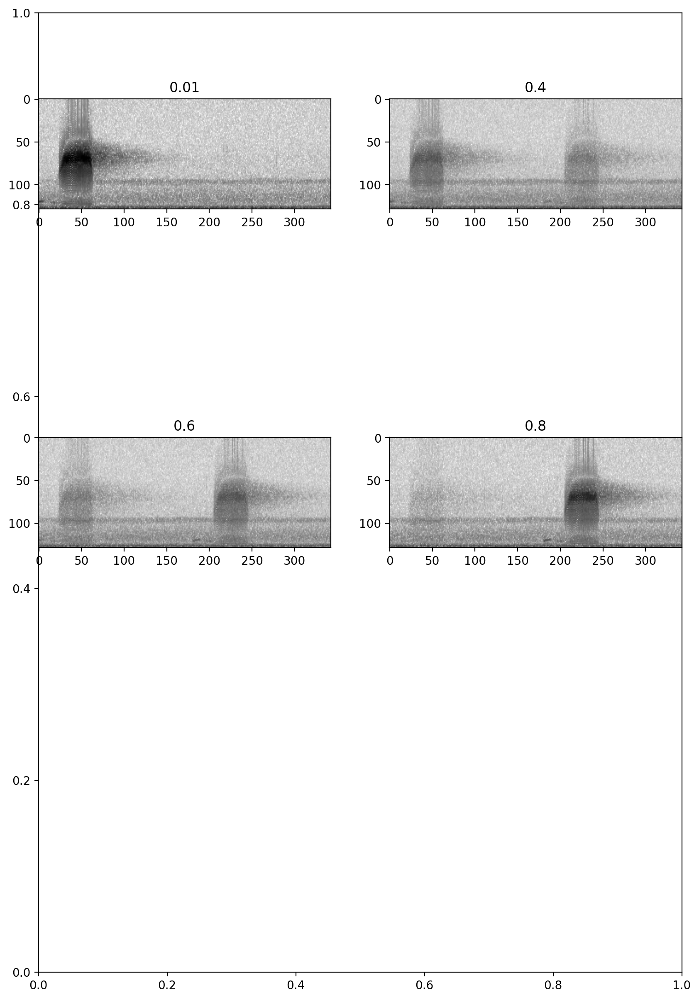

In [49]:
preprocessor.pipeline.overlay.set(overlay_class='present')
tensors = []
overlay_weights = [0.01, 0.4, 0.6, 0.8]
for w in overlay_weights:
    preprocessor.pipeline.overlay.set(overlay_weight=w)
    dataset = AudioFileDataset(labels,preprocessor)
    np.random.seed(0) #get the same overlay every time
    tensors.append(dataset[2].data)
_ = show_tensor_grid(tensors, 2, labels=overlay_weights)

#### Overlay samples from a specific class

As demonstrated above, you can choose a specific class to choose samples from. Here, instead, we choose samples from the "absent" class.

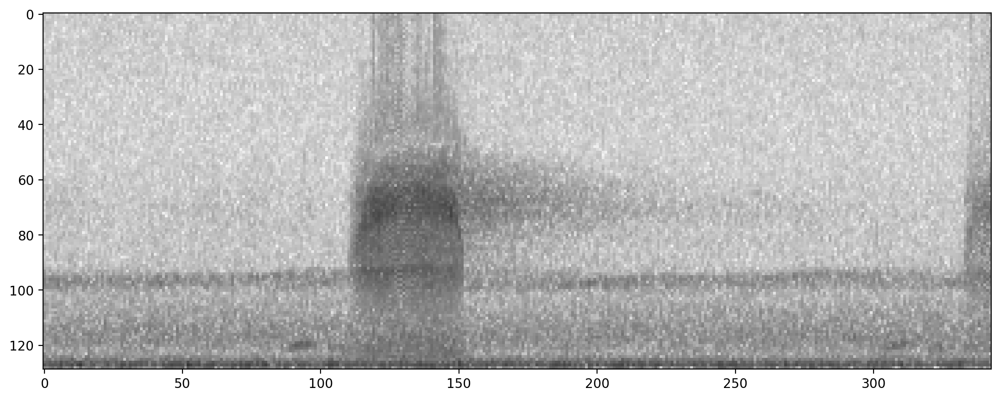

In [50]:
dataset.preprocessor.pipeline.overlay.set(
    overlay_class='present',
    overlay_weight=0.4
)
show_tensor(dataset[0].data)

#### Overlaying samples from any class
By default, or by specifying `overlay_class=None`, the overlay sample is chosen randomly from the overlay_df with no restrictions.

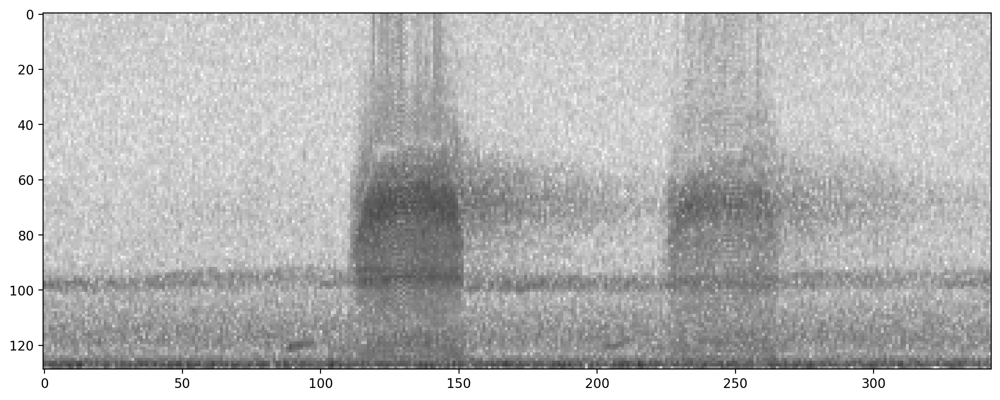

In [51]:
dataset.preprocessor.pipeline.overlay.set(overlay_class=None)
show_tensor(dataset[0].data)

#### Overlaying samples from a "different" class
The `'different'` option for `overlay_class` chooses a sample to overlay that has non-overlapping labels with the original sample. 

In the case of this example, this has the same effect as drawing samples from the `"negative"` class a demonstrated above. In multi-class examples, this would draw from any of the samples not labeled with the class(es) of the original sample.

We'll again use `overlay_weight=0.8` to exaggerate the importance of the overlayed sample (80%) compared to the original sample (20%). 

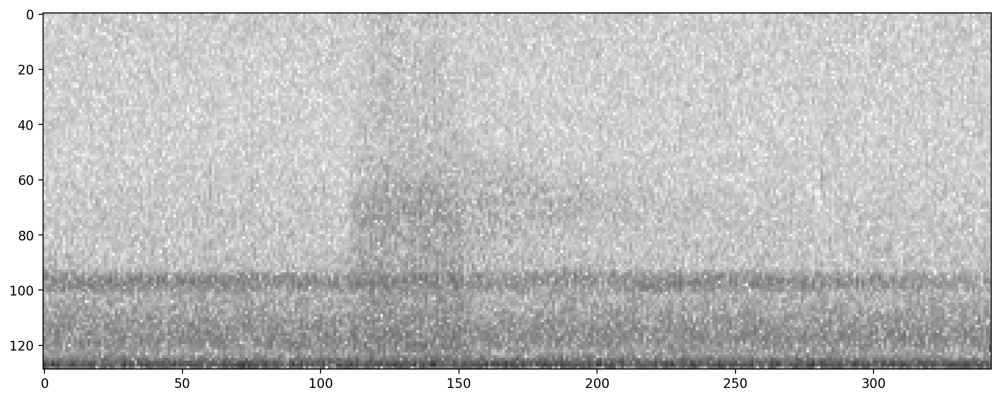

In [52]:
dataset.preprocessor.pipeline.overlay.set(update_labels=False,overlay_class='different',overlay_weight=0.8)
show_tensor(dataset[0].data)

#### Updating labels 
By default, the overlay Action does **not** change the labels of the sample it modifies. 

For instance, if the overlayed sample has labels [1,0] and the original sample has labels [0,1], the default behavior will return a sample with labels [0,1] not [1,1]. 

If you wish to add the labels from overlayed samples to the original sample's labels, you can set `update_labels=True`. 

In [53]:
print('default: labels do not update')
dataset.preprocessor.pipeline.overlay.set(update_labels=False,overlay_class='different')
print(f"\t resulting labels: \n {dataset[1].labels}")

print('Using update_labels=True')
dataset.preprocessor.pipeline.overlay.set(update_labels=True,overlay_class='different')
print(f"\t resulting labels: \n {dataset[1].labels}")


default: labels do not update
	 resulting labels: 
 present    0
absent     1
Name: ./woodcock_labeled_data/e84a4b60a4f2d049d73162ee99a7ead8.wav, dtype: int64
Using update_labels=True
	 resulting labels: 
 present    1
absent     1
Name: ./woodcock_labeled_data/e84a4b60a4f2d049d73162ee99a7ead8.wav, dtype: int64


This example is a single-target problem: the two classes represent "woodcock absent" and "woodcock present." Because the labels are mutually exclusive, labels [1,1] do not make sense. So, for this single-target problem, we would __not__ want to use `update_labels=True`, and it would probably make most sense to only overlay absent recordings, e.g., `overlay_class='absent'`.

## Create a new Preprocessor class
If you have a specific augmentation routine you want to perform, you may want to create your own Preprocessor class rather than modifying an existing one. 

Your subclass might add a different set of Actions, define a different pipeline, or even override the `__getitem__` method of BasePreprocessor. 

Here's an example of a customized preprocessor that subclasses `AudioToSpectrogramPreprocessor` and creates a pipeline that depends on the `magic_parameter` input. 

In [54]:
from opensoundscape.preprocess.actions import Action, tensor_add_noise
class MyPreprocessor(SpectrogramPreprocessor):
    """Child of AudioToSpectrogramPreprocessor with weird augmentation routine"""
    
    def __init__(
        self,
        magic_parameter,
        sample_duration,
        height=224,
        width=224,
    ):

        super(MyPreprocessor, self).__init__(
            sample_duration=sample_duration,height=height,width=width,
        )

        for i in range(magic_parameter):
            action = Action(tensor_add_noise, std=0.1*magic_parameter)
            self.insert_action(f'noise_{i}',action)

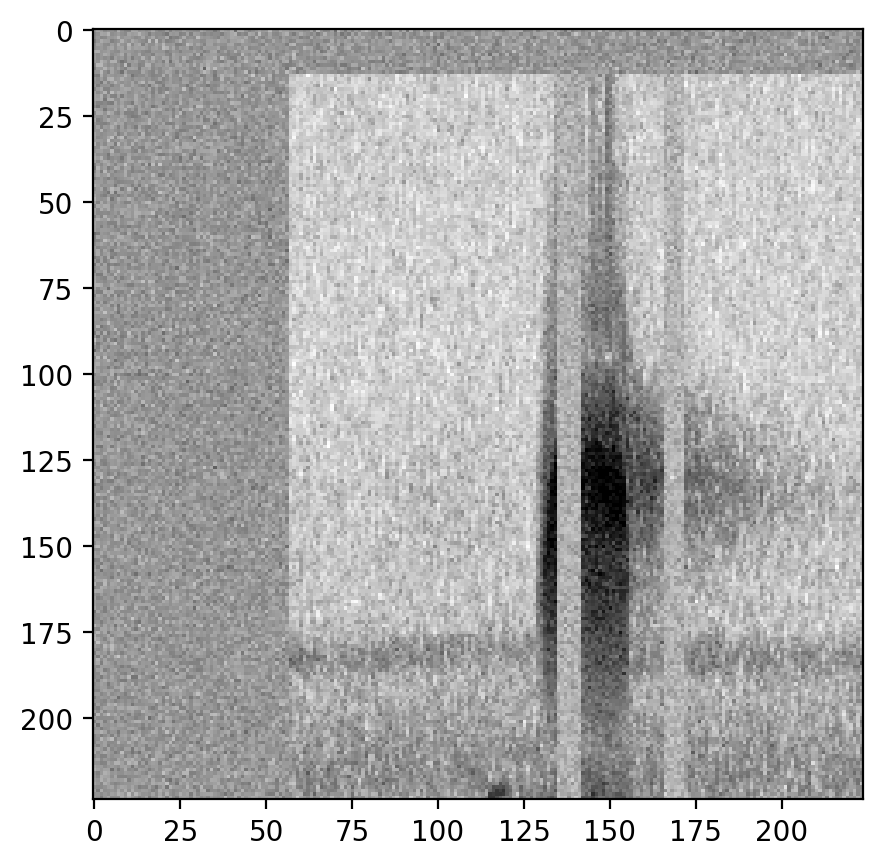

In [55]:
dataset = AudioFileDataset(labels, MyPreprocessor(sample_duration=2.0, magic_parameter=1))
show_tensor(dataset[0].data)

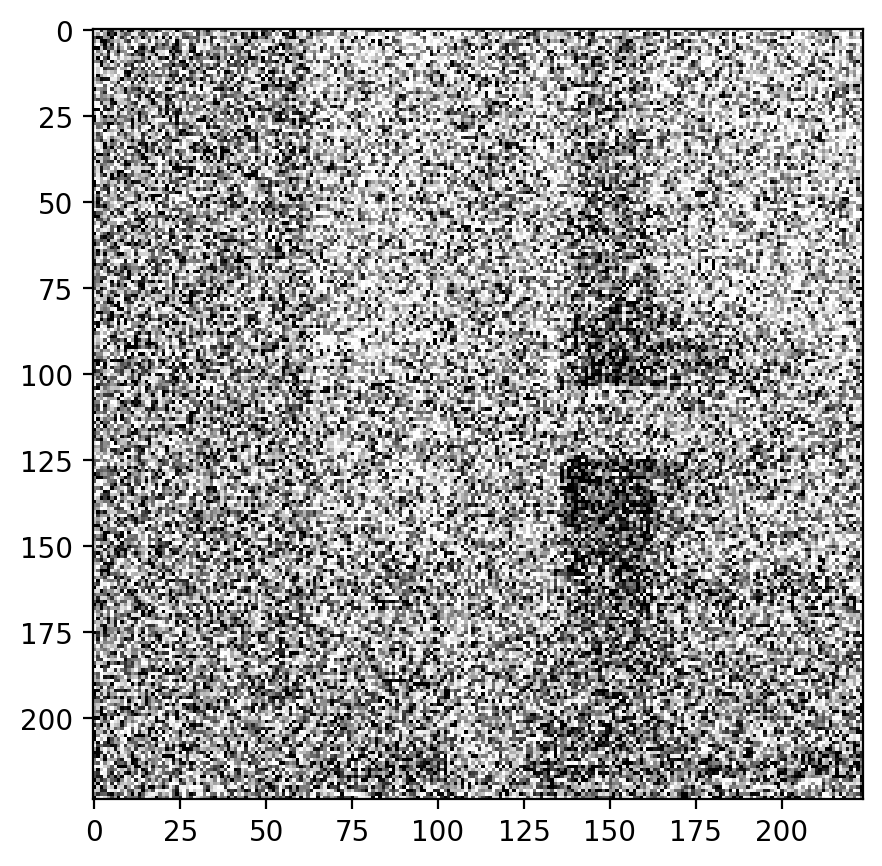

In [56]:
dataset = AudioFileDataset(labels, MyPreprocessor(sample_duration=2.0, magic_parameter=4))
show_tensor(dataset[0].data)

## Define new Actions
You can usually define a new action simply by passing a method to Action(). However, you can also write a subclass of Action for more advanced use cases.

In [57]:
from opensoundscape.preprocess.actions import Action, BaseAction


class AudioGate(BaseAction):
    """Replace audio samples below a threshold with 0, but only if label[0]==1
    
    Audio in, Audio out
    
    Args: 
        threshold: sample values below this will become 0
    """
    def __init__(self,threshold):
        super(AudioGate,self).__init__()
        self.params['threshold']=threshold
        
    def go(self,sample,**kwargs):
        threshold = 0.2
        if sample.labels[0]==1:
            samples = np.array([0 if np.abs(s)<threshold else s for s in audio.samples])
            sample.data = Audio(samples, audio.sample_rate)

Test it out:

histogram of samples


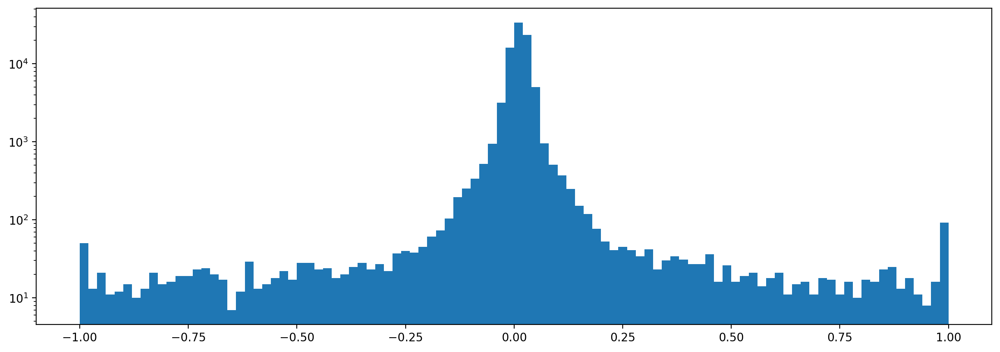

histogram of samples after audio gate


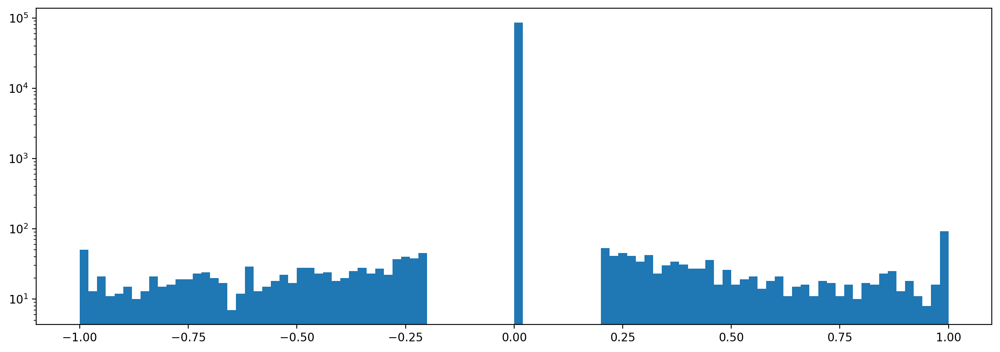

histogram of samples after audio gate, when labels[0]==0
histogram of samples


[]

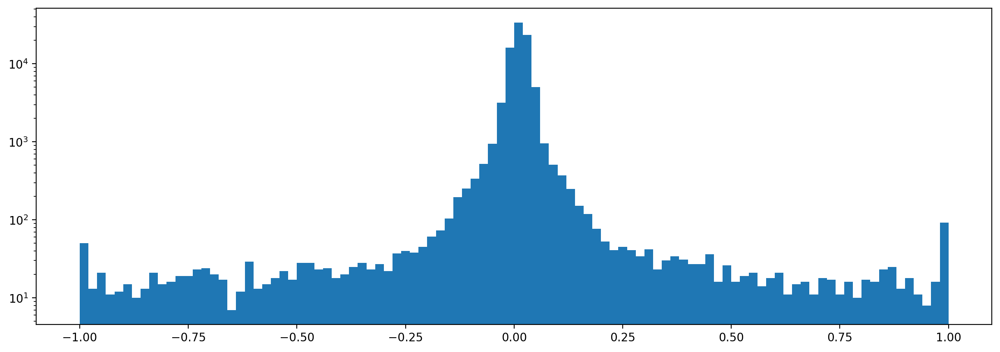

In [58]:
from opensoundscape import Audio, Spectrogram, AudioSample

gate_action = AudioGate(threshold=0.2)

print('histogram of samples')
audio = Audio.from_file('./woodcock_labeled_data/01c5d0c90bd4652f308fd9c73feb1bf5.wav')
sample = AudioSample(source=audio,labels={0:1,1:0})

_ = plt.hist(audio.samples,bins=100)
plt.semilogy()
plt.show()

print('histogram of samples after audio gate')
gate_action.go(sample)
_ = plt.hist(sample.data.samples,bins=100)
plt.semilogy()
plt.show()

print('histogram of samples after audio gate, when labels[0]==0')
print('histogram of samples')
audio = Audio.from_file('./woodcock_labeled_data/01c5d0c90bd4652f308fd9c73feb1bf5.wav')
sample = AudioSample(source=audio,labels={0:0,1:1})
gate_action.go(sample)
_ = plt.hist(sample.data.samples,bins=100)
plt.semilogy()

## Add custom Action to a preprocessor
For instance, if you want to use your custom Action while training a cnn, you can add it to the `cnn.preprocessor`'s pipeline.

In this example, we put the custom AudioGate action before the `to_spec` action. 

In [59]:
gate_action = AudioGate(threshold=0.2)
preprocessor.insert_action( 
    action_index='custom_audio_gate', #give it a name
    action=gate_action,
    before_key='to_spec', #where to put it (can also use before_key=...)
)

In [60]:
preprocessor.pipeline

load_audio           Action calling <bound method Audio.from_file o...
random_trim_audio    Augmentation Action calling <function trim_aud...
trim_audio           Action calling <function trim_audio at 0x2aac5...
custom_audio_gate                                               Action
to_spec              Action calling <bound method Spectrogram.from_...
bandpass             Action calling <function Spectrogram.bandpass ...
to_tensor            Action calling <function Spectrogram.to_image ...
overlay              Augmentation Action calling <function overlay ...
rescale              Action calling <function scale_tensor at 0x2aa...
dtype: object

Clean up files created during this tutorial:

In [61]:
import shutil
shutil.rmtree('./woodcock_labeled_data')